What is the impact of on top products on listing performance?

Are there any patterns in the data you would consider interesting or unexpected?

What is the influence of other variables included in the data set on listing performance?

Which additional data would you employ for further analyses? 

In [1]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import pandas as pd
import plotly.express as px

In [2]:
#Loading the data set.
df = pd.read_csv ("../input/dataset/AS24 Data Analyst Case Study data 2021 04.csv",sep=';')
df_info = pd.read_csv ("../input/dataset/AS24 Data Analyst Case Study data descrip 2021 04.csv",sep=';')
pd.set_option('display.max_colwidth', -1)
df_info = df_info.rename({'column name': 'X'}, axis=1)
df_info[0:12]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  after removing the cwd from sys.path.


,X,description
0,article_id,unique article identifier
1,product_tier,premium status of the article
2,make_name,name of the car manufacturer
3,price,price of the article
4,first_zip_digit,first digit of the zip code of the region the article is offered in
5,first_registration_year,year of the first registration of the article
6,created_date,creation date of the listing
7,deleted_date,deletion date of the listing
8,search_views,number of times the article has been shown as a search result
9,detail_views,number of times the article has been clicked on


In [3]:
df[0:3]

,article_id,product_tier,make_name,price,first_zip_digit,first_registration_year,created_date,deleted_date,search_views,detail_views,stock_days,ctr
0,350625839,Basic,Mitsubishi,16750,5,2013,24.07.18,24.08.18,3091.0,123.0,30,0.03780329990294403
1,354412280,Basic,Mercedes-Benz,35950,4,2015,16.08.18,07.10.18,3283.0,223.0,52,0.06792567773378008
2,349572992,Basic,Mercedes-Benz,11950,3,1998,16.07.18,05.09.18,3247.0,265.0,51,0.0816137973514013


In [4]:
#Convert STR to Float
df['ctr'] = pd.to_numeric(df['ctr'],errors = 'coerce')


In [5]:
#Check the type of all variable.
dataTypeSeries = df.dtypes
print('Data type of each column of Dataframe :')
print(dataTypeSeries)

Data type of each column of Dataframe :
article_id                 int64  
product_tier               object 
make_name                  object 
price                      int64  
first_zip_digit            int64  
first_registration_year    int64  
created_date               object 
deleted_date               object 
search_views               float64
detail_views               float64
stock_days                 int64  
ctr                        float64
dtype: object


In [6]:
#The shape of data set.
print('The shape of our features is:', df.shape)
df=df.replace(np.nan,0)

The shape of our features is: (78321, 12)


In [7]:
#Check if there is a null data.
df.isnull().sum()

article_id                 0
product_tier               0
make_name                  0
price                      0
first_zip_digit            0
first_registration_year    0
created_date               0
deleted_date               0
search_views               0
detail_views               0
stock_days                 0
ctr                        0
dtype: int64

In [8]:
#See unique value of product_tier.
print(df['product_tier'].unique())

['Basic' 'Premium' 'Plus']


Identified outliers: 870
Non-outlier observations: 77451


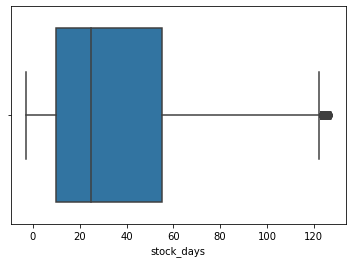

In [9]:
import math
from statistics import *
from statistics import stdev
sns.boxplot(x=df['stock_days'])
# calculate summary statistics
data_mean, data_std = mean(df.first_registration_year), np.std(df.first_registration_year)
# identify outliers
cut_off = data_std * 3
lower, upper = data_mean - cut_off, data_mean + cut_off
# identify outliers
outliers = [x for x in df.first_registration_year if x < lower or x > upper]
print('Identified outliers: %d' % len(outliers))
# remove outliers
outliers_removed = [x for x in df.first_registration_year if x >= lower and x <= upper]
print('Non-outlier observations: %d' % len(outliers_removed))


EXPLORATORY ANALYSIS

In [10]:
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
fig = px.histogram(df, x="first_zip_digit", nbins=20, color="product_tier", title="Distribution of ietm per region code")
fig.show()



In [11]:
per=df[df['product_tier']== "Premium"]
per = per.sort_values(['ctr'], ascending=[False])
per = per [:1000]
#per=df[df['product_tier']== "Premium"]
per = per.sort_values(['ctr'], ascending=[False])
fig = px.scatter(per,x = 'make_name', y = 'ctr',color='make_name',size ='ctr',
                title="Top 20 car with highest CTR in permium")
fig.show()


In [12]:
fig = px.histogram(df, x="first_registration_year",color="product_tier", nbins=10,  title="Distribution of ietm per first registration year ")
fig.show()

In [13]:
fig = px.histogram(df, x="stock_days", nbins=10,color="product_tier",  title="Distribution of ietm per first stoc kdays")
fig.show()


See the most top car in term of detail view.

In [14]:
df_car_count = df.groupby(['make_name'],as_index=False).agg({'ctr':pd.Series.sum})
df_car_count = df_car_count.sort_values(['ctr'], ascending=[False])
df_car_count_cut = df_car_count[:20]
df_car_count_cut.head(4)

,make_name,ctr
88,Volkswagen,465.653806
73,Renault,297.309893
69,Peugeot,261.533103
67,Opel,238.678337


In [15]:
fig = px.scatter(df_car_count_cut,x = 'make_name', y = 'ctr',color='make_name',size ='ctr',
                title="Top 20 car with highest CTR")
fig.show()
'''
sns.set(font_scale=1.3)  # crazy big
ax = sns.FacetGrid(data=df_car_count_cut,height=5, aspect=2)
ax.map(sns.scatterplot, "make_name","ctr",s=90)
ax.add_legend(fontsize=30)
plt.title("The 30 top car with respect to Click through rate ",fontsize=22)
plt.xticks(rotation=90)
plt.show()'''

'\nsns.set(font_scale=1.3)  # crazy big\nax = sns.FacetGrid(data=df_car_count_cut,height=5, aspect=2)\nax.map(sns.scatterplot, "make_name","ctr",s=90)\nax.add_legend(fontsize=30)\nplt.title("The 30 top car with respect to Click through rate ",fontsize=22)\nplt.xticks(rotation=90)\nplt.show()'

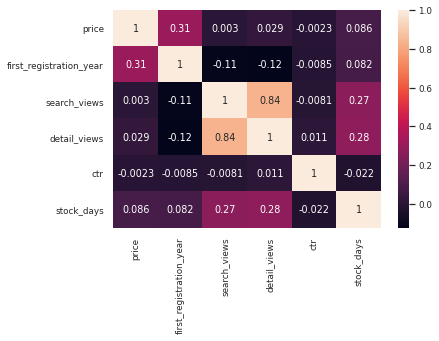

In [16]:
#To see the correlation between featurs
df_encoded = df[['product_tier','make_name','price','first_registration_year','search_views','detail_views',"ctr","stock_days"]]
corr = df_encoded.corr(method='pearson')
sns.set(font_scale=0.8) 
sns.heatmap(corr,annot=True)
plt.show()

What is the impact of on top products on listing performance?


In [17]:
df['count'] = df.groupby('make_name')['make_name'].transform('count')
df_sort_count = df.sort_values(['count'], ascending=[False])
df_sort_count = df_sort_count [:62656]  #o see top car in 80%(62656) of all the brand manufacturer
fig = px.histogram(df_sort_count, x="make_name", nbins=20, color="product_tier",
                   title="Distribution of brand manufacturer in 80% of listing")
fig.show()

In [18]:
fig = px.histogram(df, x="product_tier", nbins=10, color="product_tier", title="Count per product categoy")

fig.show()

1. As we can see the ratio of Permium and plus product to the basic is qute low (0.02 fo Permium and 0.007 for Plus respectively.

In [19]:
df_tier_count=df['product_tier'].value_counts()
df_tier=df_tier_count.to_frame().reset_index()
df_tier_count = df_tier_count.rename({'index': 'product_tier', 'product_tier':'count'}, axis=1)
df_tier_count["Ratio"] = df_tier.iloc[:, 1:].apply(lambda x: x / x.sum())
print(df_tier_count)
data = [['Basic', 0.962973], ['Premium', 0.029673], ['Plus', 0.007354]]
# Create the pandas DataFrame
df_count = pd.DataFrame(data, columns = ['product_tier', 'percentage'])
df_count

Basic      75421                                                          
Premium    2324                                                           
Plus       576                                                            
Ratio         product_tier
0  0.962973    
1  0.029673    
2  0.007354    
Name: product_tier, dtype: object


,product_tier,percentage
0,Basic,0.962973
1,Premium,0.029673
2,Plus,0.007354


In [20]:
#Lets see search view ratio per product_tier
df_tier_search = df.groupby('product_tier')['search_views'].sum().to_frame()
df_tier_search["Ratio"] = df_tier_search.iloc[:, 0:].apply(lambda x: x / x.sum())
df_tier_search = df_tier_search.reset_index()
df_tier_search
df_tier_search = df_tier_search.rename(columns={'Ratio':'Ratio_search'})
df_tier_search

,product_tier,search_views,Ratio_search
0,Basic,144642470.0,0.803928
1,Plus,3870400.0,0.021512
2,Premium,31406850.0,0.174560


In [21]:
#Lets see detail view ratio per product_tier
df_tier_details=df.groupby('product_tier')['detail_views'].sum().to_frame()
df_tier_details["Ratio"] = df_tier_details.iloc[:, 0:].apply(lambda x: x / x.sum())
df_tier_details = df_tier_details.reset_index()
df_tier_details
df_tier_details = df_tier_details.rename(columns={'Ratio':'Ratio_detail'})
df_tier_details

,product_tier,detail_views,Ratio_detail
0,Basic,6241881.0,0.852749
1,Plus,143267.0,0.019573
2,Premium,934571.0,0.127679


In [22]:
#Lets merge search view ratio and detain view ratio together.
df_merge1 = pd.merge(df_tier_details,df_count,on='product_tier')
df_merge = pd.merge( df_merge1,df_tier_search, on='product_tier')
df_merge

,product_tier,detail_views,Ratio_detail,percentage,search_views,Ratio_search
0,Basic,6241881.0,0.852749,0.962973,144642470.0,0.803928
1,Plus,143267.0,0.019573,0.007354,3870400.0,0.021512
2,Premium,934571.0,0.127679,0.029673,31406850.0,0.174560


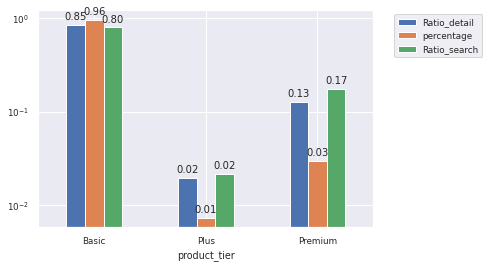

In [23]:
plots= df_merge.plot.bar(x='product_tier',y= ['Ratio_detail','percentage','Ratio_search'], logy=True)

for bar in plots.patches:
    plots.annotate(format(bar.get_height(), '.2f'), 
                   (bar.get_x() + bar.get_width() / 2, 
                    bar.get_height()), ha='center', va='center',
                   size=10, xytext=(0, 8),
                   textcoords='offset points')
    
plt.xticks(rotation=0)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()


As we can see from the plot above, 0.96% of products is categorized as basics.
and only 0.01 and 0.03 of product are categorized as Plus and Permium.

But it is shown that the detail view and search view of Permium and Plus is higher with respect to thier contribution.

For example there is just 0.03 of whole category belong to permium but 
0.17 percent of all search view is belong to Perimum.

In [24]:
print(df['product_tier'].value_counts())


Basic      75421
Premium    2324 
Plus       576  
Name: product_tier, dtype: int64


Vidualizing Total detail view per car and product category(category_tier)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



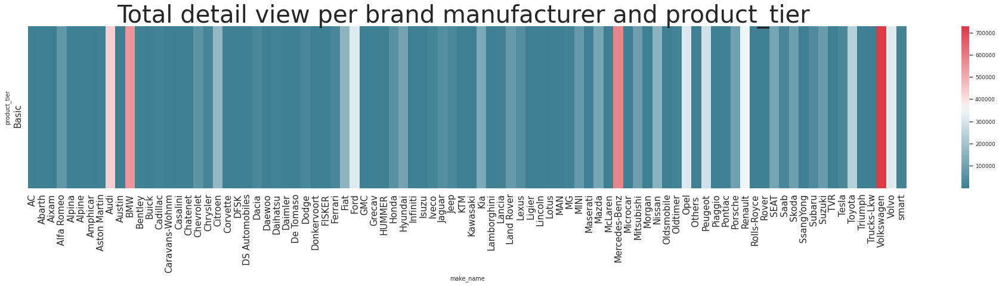

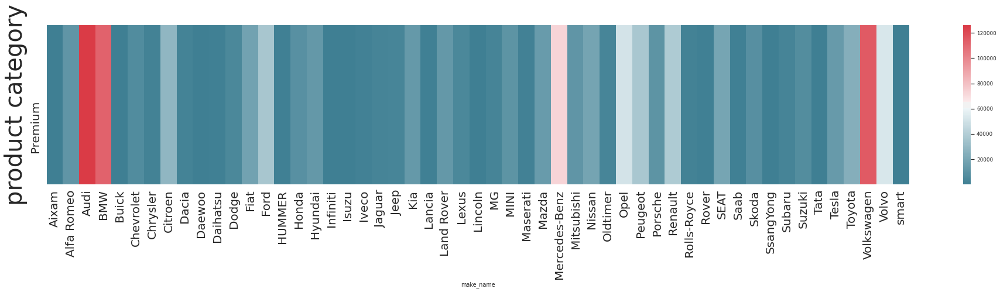

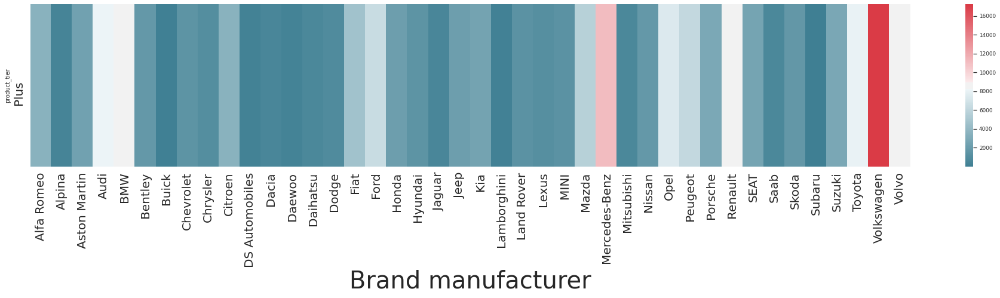

In [25]:
data_filter = df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','make_name'])['detail_views','search_views','ctr'].sum()
data_filter = data_filter.reset_index()
data_filter_ = df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','make_name'])['detail_views','search_views','ctr'].sum()
data_filter_ = data_filter_.reset_index()
data_filter__ = df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','make_name'])['detail_views','search_views','ctr'].sum()
data_filter__= data_filter__.reset_index()



df_heatmap = data_filter.pivot_table(values='detail_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=15)

plt.title('Total detail view per brand manufacturer and product_tier ', size = 40)
plt.show()


df_heatmap = data_filter_.pivot_table(values='detail_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.ylabel('product category',size = 40)
plt.show()


df_heatmap = data_filter__.pivot_table(values='detail_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.xlabel('Brand manufacturer',size = 40)
plt.show()

#,annot=True,fmt='g'



As we can see from the chart, in both Basic and Permium, Volkswagen, Mercedes_Benz, BMW and Audi, show the highest amount of Detail view. 
And in Plus category Volkswagen, Mercedes_Benz show the highest amount of Detail view.

Vidualizing Total detail view per car and product category(category_tier)

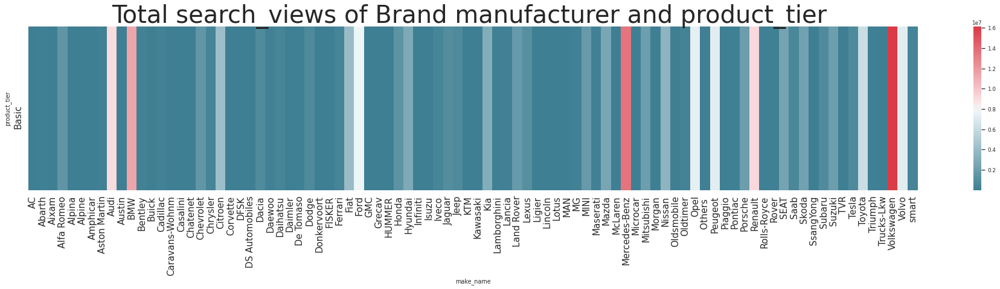

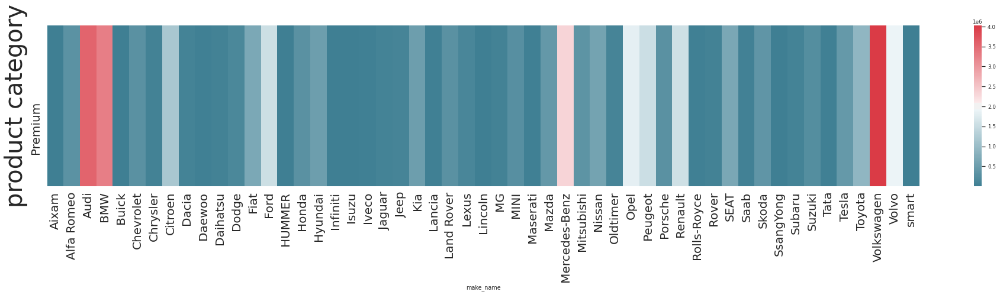

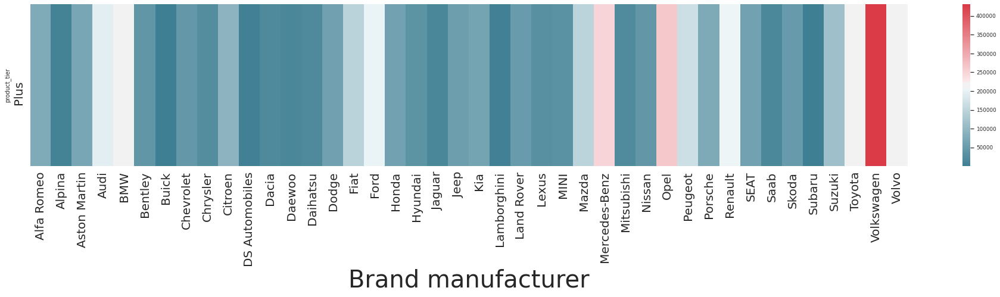

In [26]:

df_heatmap = data_filter.pivot_table(values='search_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=15)

plt.title('Total search_views of Brand manufacturer and product_tier ', size = 40)
plt.show()


df_heatmap = data_filter_.pivot_table(values='search_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.ylabel('product category',size = 40)
plt.show()


df_heatmap = data_filter__.pivot_table(values='search_views',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.xlabel('Brand manufacturer',size = 40)
plt.show()

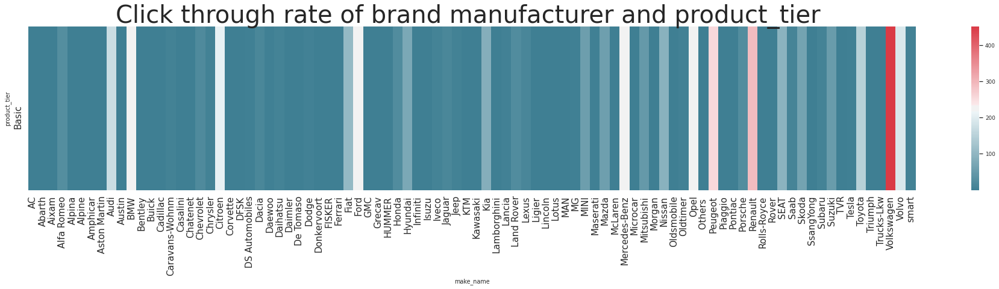

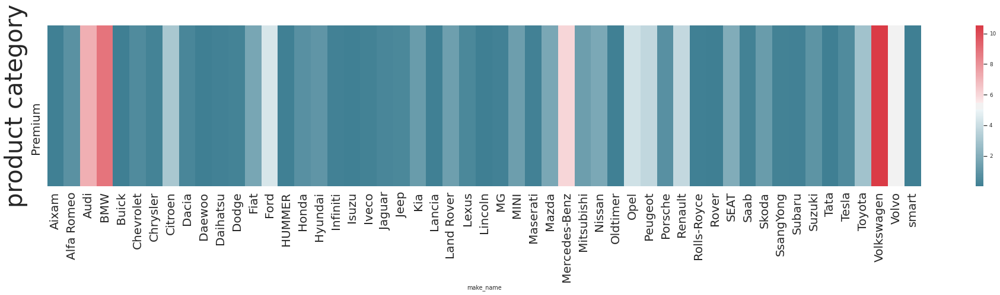

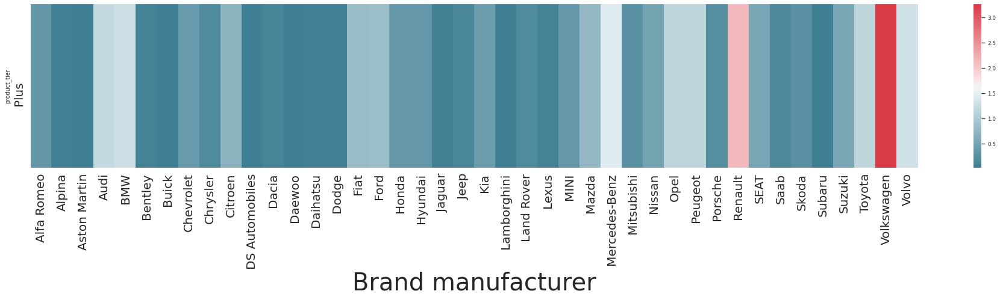

In [27]:

df_heatmap = data_filter.pivot_table(values='ctr',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=15)

plt.title('Click through rate of brand manufacturer and product_tier ', size = 40)
plt.show()


df_heatmap = data_filter_.pivot_table(values='ctr',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.ylabel('product category',size = 40)
plt.show()


df_heatmap = data_filter__.pivot_table(values='ctr',index='product_tier',columns='make_name',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(33,5))
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
ax.tick_params(labelsize=20)


plt.xlabel('Brand manufacturer',size = 40)
plt.show()

Vidualizing the correlation of search_views and car manufacturer and car price

In [28]:
data_filter_price=df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
data_filter_price = data_filter_price.reset_index()
data_filter_price = data_filter_price.sort_values(['price', 'search_views'], ascending=[False, False])
data_filter_price = data_filter_price [:500]
data_filter_price.head(6)

data_filter_price_b=df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
data_filter_price_b= data_filter_price_b.reset_index()
data_filter_price_b= data_filter_price_b.sort_values(['price', 'search_views'], ascending=[False, False])
data_filter_price_b= data_filter_price_b[:500]
data_filter_price_b.head(6)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,product_tier,make_name,price,detail_views,search_views,ctr
4796,Basic,Ferrari,249888,128.0,3842.0,0.031650
12437,Basic,Mercedes-Benz,248341,658.0,19785.0,0.033258
2857,Basic,Bentley,239800,567.0,20950.0,0.027064
4795,Basic,Ferrari,239500,2402.0,30772.0,0.151632
15232,Basic,Others,235000,42.0,2079.0,0.020202
17024,Basic,Porsche,229950,1772.0,15085.0,0.111594


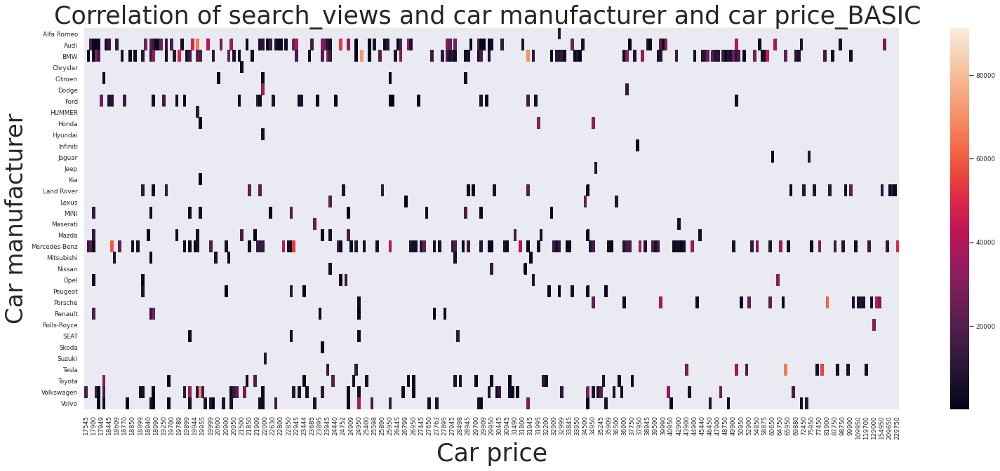

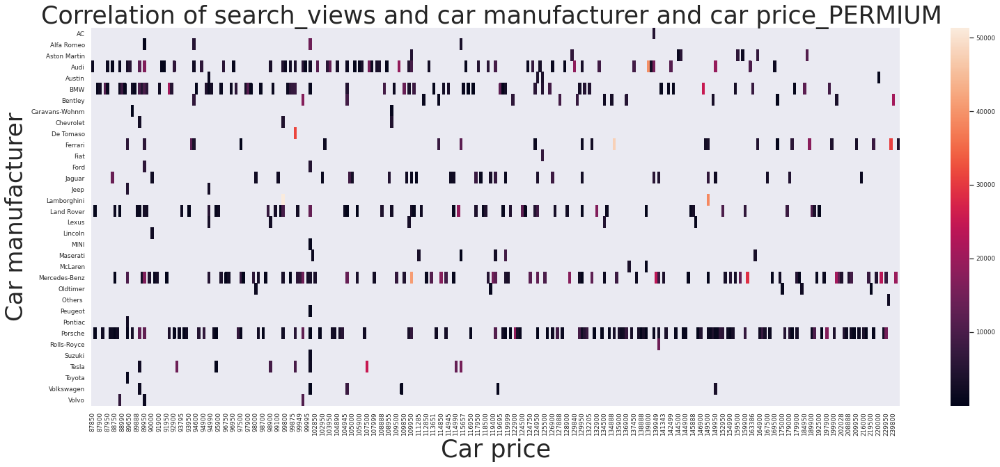

In [29]:
df_heatmap = data_filter_price.pivot_table(values='search_views',index='make_name',columns='price',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,10))         
sns.heatmap(df_heatmap)
plt.xlabel('Car price',size = 35)
plt.ylabel('Car manufacturer',size = 34)
plt.title('Correlation of search_views and car manufacturer and car price_BASIC ', size = 35)
plt.show()




df_heatmap = data_filter_price_b.pivot_table(values='search_views',index='make_name',columns='price',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,10))         
sns.heatmap(df_heatmap)
plt.xlabel('Car price',size = 35)
plt.ylabel('Car manufacturer',size = 34)
plt.title('Correlation of search_views and car manufacturer and car price_PERMIUM ', size = 35)
plt.show()

In the first and second chart, we can detect, the high amount of the search view with respect to price and brand.I just vidualized the top 500 with respect to price. in both basic and permium category. 
for example in permium category, it can be see that the highest amount of search view for Tesla, can be seen at price of 64800.

This chart shows diffrent range of car manufacturere price. 
Also it shows for diffrent manufacturer in which price we have the highest amount of serach views.


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



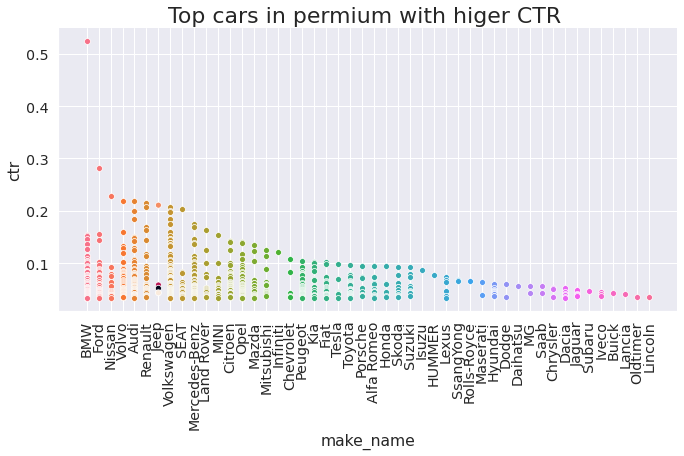

In [30]:
df_pr_ctr=df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
df_pr_ctr = df_pr_ctr.reset_index()
df_pr_ctr = df_pr_ctr.sort_values(['ctr'], ascending=[False])
df_pr_ctr = df_pr_ctr [:1000]

#plot
sns.set(font_scale=1.3)  # crazy big
ax = sns.FacetGrid(data = df_pr_ctr ,hue="make_name",height=5, aspect=2)
ax.map(sns.scatterplot,'make_name',"ctr")
ax.add_legend(fontsize=22)
plt.title("Top cars in permium with higer CTR ",fontsize=22)
ax.set_xticklabels(rotation=90)
ax._legend.remove()
plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



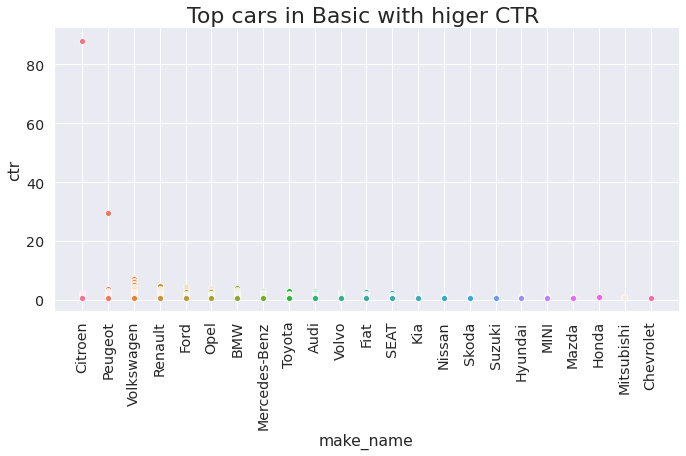

In [31]:
df_ba_ctr=df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
df_ba_ctr = df_ba_ctr.reset_index()
df_ba_ctr = df_ba_ctr.sort_values(['ctr'], ascending=[False])
df_ba_ctr = df_ba_ctr [:1000]

#plot
sns.set(font_scale=1.3)  # crazy big
ax = sns.FacetGrid(data = df_ba_ctr ,hue="make_name",height=5, aspect=2)
ax.map(sns.scatterplot,'make_name',"ctr")
ax.add_legend(fontsize=22)
plt.title("Top cars in Basic with higer CTR ",fontsize=22)
ax.set_xticklabels(rotation=90)
ax._legend.remove()
#plt.ylim(0, 50)
plt.show()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



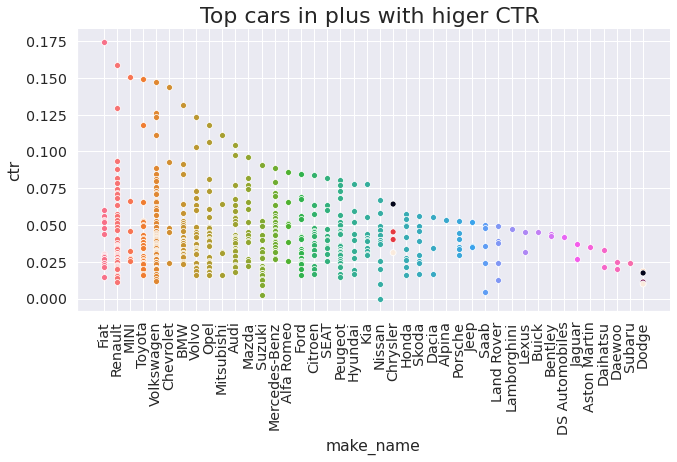

In [32]:
df_pl_ctr=df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
df_pl_ctr = df_pl_ctr.reset_index()
df_pl_ctr = df_pl_ctr.sort_values(['ctr'], ascending=[False])
df_pl_ctr = df_pl_ctr [:1000]

#plot
sns.set(font_scale=1.3)  # crazy big
ax = sns.FacetGrid(data = df_pl_ctr ,hue="make_name",height=5, aspect=2)
ax.map(sns.scatterplot,'make_name',"ctr")
ax.add_legend(fontsize=22)
plt.title("Top cars in plus with higer CTR ",fontsize=22)
ax.set_xticklabels(rotation=90)
ax._legend.remove()
plt.show()

In [33]:
df_p=df[df['make_name'].str.contains('BMW')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
df_p = df_p.reset_index()
df_p = df_p.sort_values(['ctr'], ascending=[ False])
df_p.head(6)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,product_tier,make_name,price,detail_views,search_views,ctr
206,Basic,BMW,6950,8308.0,133357.0,3.972664
299,Basic,BMW,9950,9737.0,150997.0,3.284371
555,Basic,BMW,19950,8422.0,151641.0,3.058419
423,Basic,BMW,14950,8546.0,164645.0,2.850052
399,Basic,BMW,13950,4313.0,81870.0,2.636842
676,Basic,BMW,24950,3007.0,52385.0,2.500475


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



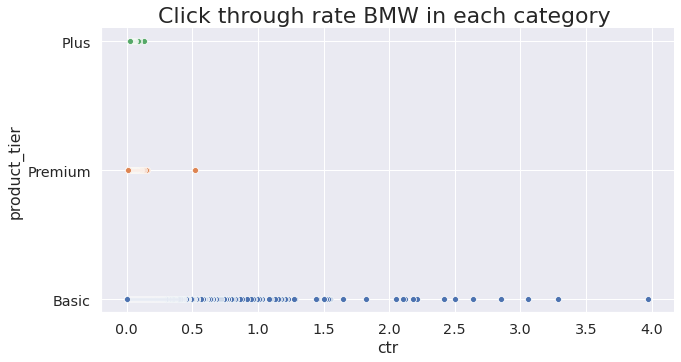

In [34]:
df_p=df[df['make_name'].str.contains('BMW')].groupby(['product_tier','make_name','price'])['detail_views','search_views','ctr'].sum()
df_p = df_p.reset_index()
df_p = df_p.sort_values(['ctr'], ascending=[ False])
df_p.head(6)

import seaborn as sns
sns.set(font_scale=1.3)  # crazy big
ax = sns.FacetGrid(data = df_p ,hue="product_tier",height=5, aspect=2)
ax.map(sns.scatterplot,'ctr',"product_tier")
ax.add_legend(fontsize=22)
plt.title("Click through rate BMW in each category ",fontsize=22)
ax._legend.remove()

plt.show()

In [35]:
print(df['first_zip_digit'].unique())


[5 4 3 6 7 2 1 8 9]


In [36]:
df_zip_b = df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'detail_views':pd.Series.sum})
df_zip_p = df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'detail_views':pd.Series.sum})
df_zip_pl = df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'detail_views':pd.Series.sum})

df_zip_b.head(3)

,product_tier,first_zip_digit,detail_views
0,Basic,1,635074.0
1,Basic,2,664042.0
2,Basic,3,1092585.0


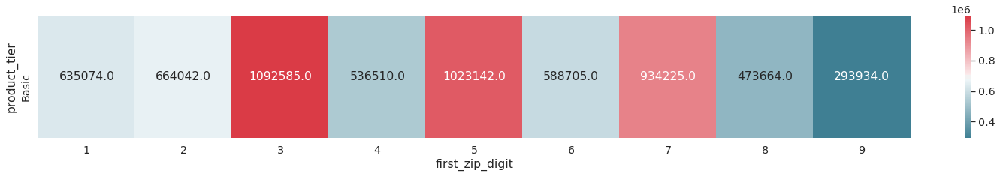

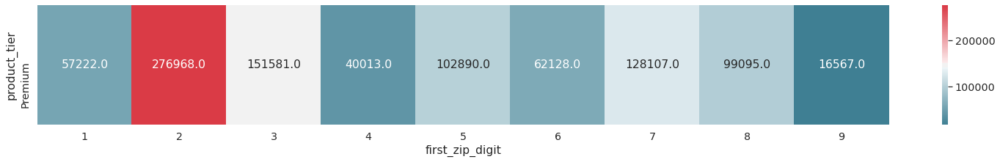

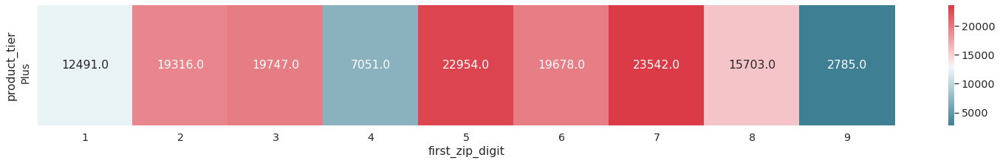

In [37]:
df_heatmap = df_zip_b.pivot_table(values='detail_views',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()


df_heatmap = df_zip_p.pivot_table(values='detail_views',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()


df_heatmap = df_zip_pl.pivot_table(values='detail_views',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()

In [38]:
df_zip_b = df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'ctr':pd.Series.sum})
df_zip_p = df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'ctr':pd.Series.sum})
df_zip_pl = df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','first_zip_digit'],as_index=False).agg({'ctr':pd.Series.sum})

df_zip_b.head(3)

,product_tier,first_zip_digit,ctr
0,Basic,1,338.683807
1,Basic,2,402.129332
2,Basic,3,686.583716


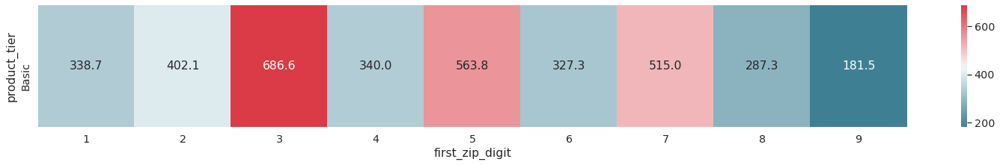

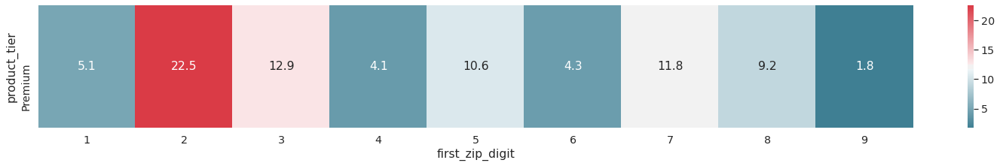

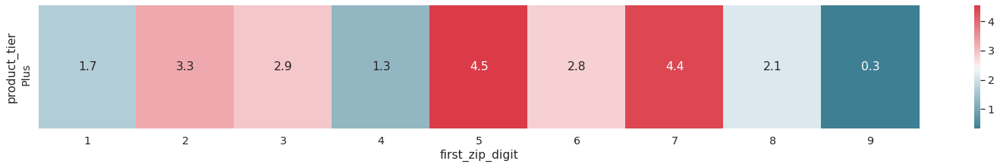

In [39]:
df_zip = df.groupby(['product_tier','make_name','first_zip_digit'],as_index=False).agg({'detail_views':pd.Series.count})
df_zip
df_heatmap = df_zip_b.pivot_table(values='ctr',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()


df_heatmap = df_zip_p.pivot_table(values='ctr',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()


df_heatmap = df_zip_pl.pivot_table(values='ctr',index='product_tier',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,3))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),annot=True,fmt='.1f')
plt.show()

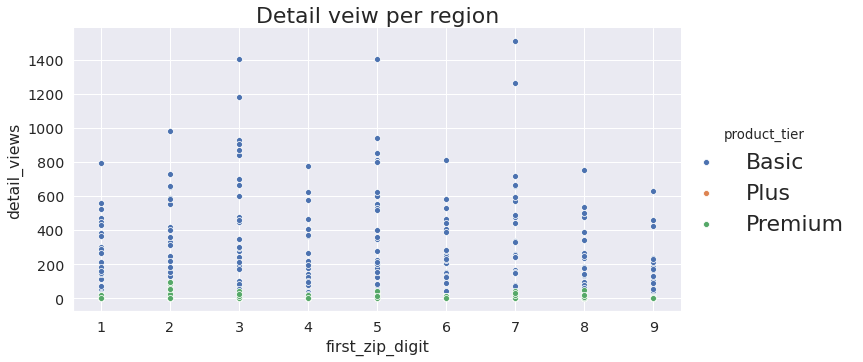

In [40]:
sns.set(font_scale=1.3)  # crazy big

ax = sns.FacetGrid(data=df_zip,hue="product_tier",height=5, aspect=2)

ax.map(sns.scatterplot, "first_zip_digit","detail_views")

ax.add_legend(fontsize=22)

plt.title("Detail veiw per region",fontsize=22)

plt.show()

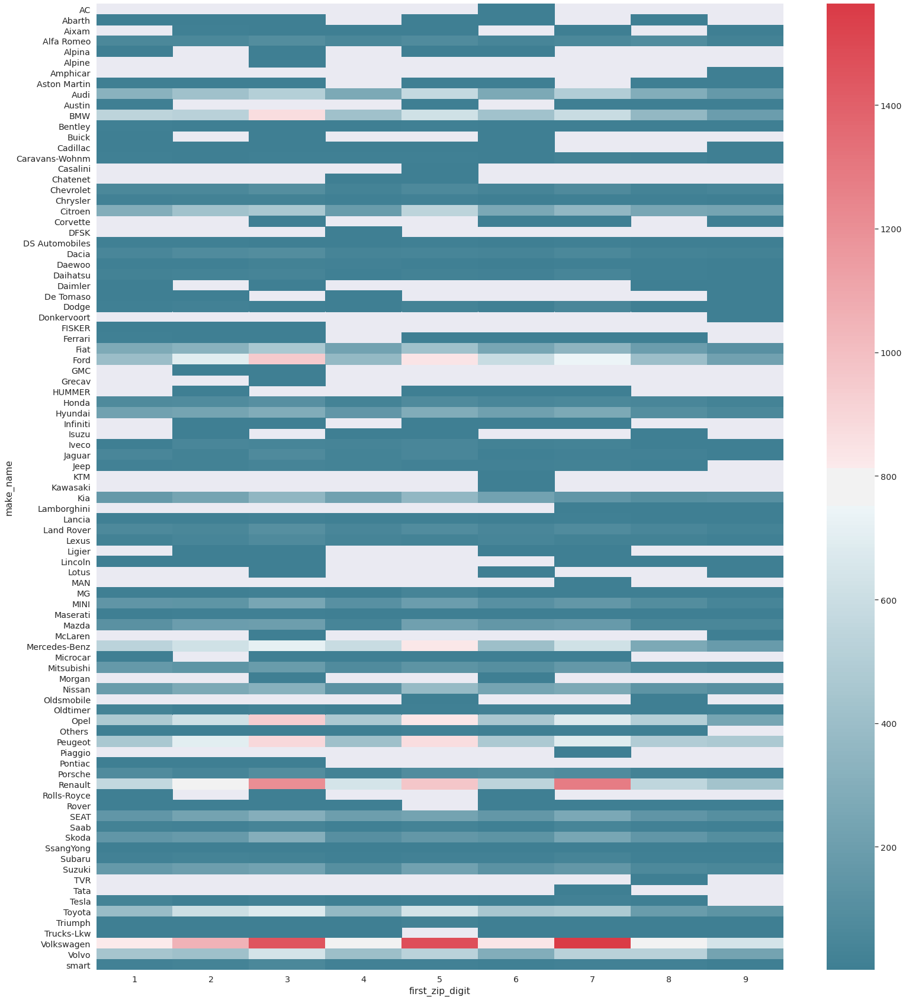

In [41]:
df_heatmap = df_zip.pivot_table(values='detail_views',index='make_name',columns='first_zip_digit',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,30))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True))
plt.show()

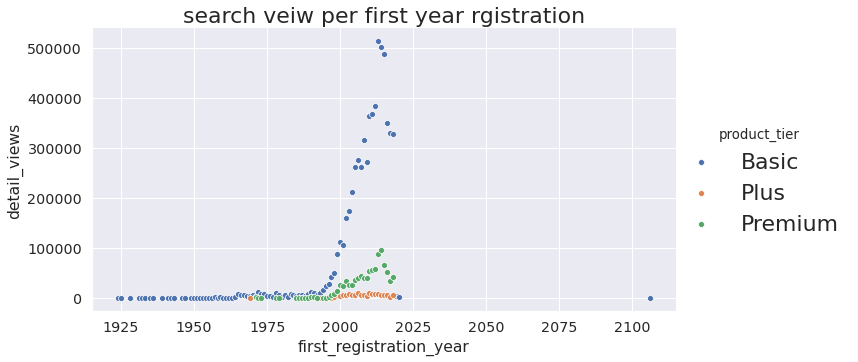

In [42]:
df_year = df.groupby(['product_tier','first_registration_year'],as_index=False).agg({'detail_views':pd.Series.sum})

sns.set(font_scale=1.3)  # crazy big

ax = sns.FacetGrid(data=df_year,hue="product_tier",height=5, aspect=2)

ax.map(sns.scatterplot, "first_registration_year","detail_views")

ax.add_legend(fontsize=22)

plt.title("search veiw per first year rgistration",fontsize=22)

plt.show()

In [43]:

df_year_b = df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','first_registration_year'],as_index=False).agg({'ctr':pd.Series.sum})
df_year_p = df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','first_registration_year'],as_index=False).agg({'ctr':pd.Series.sum})
df_year_pl = df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','first_registration_year'],as_index=False).agg({'ctr':pd.Series.sum})




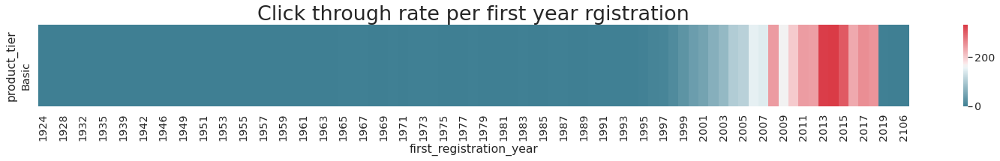

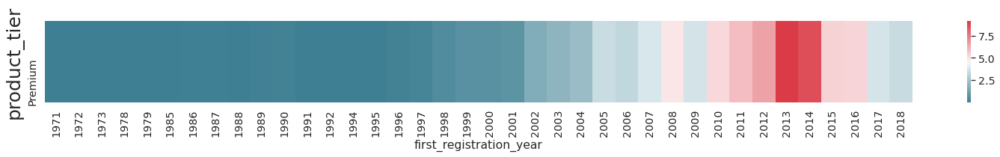

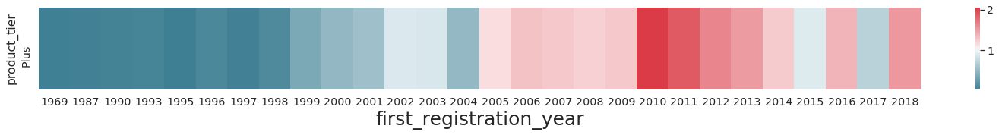

In [44]:
df_heatmap = df_year_b.pivot_table(values='ctr',index='product_tier',columns='first_registration_year',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.title('Click through rate per first year rgistration', size = 27)

plt.show()


df_heatmap = df_year_p.pivot_table(values='ctr',index='product_tier',columns='first_registration_year',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.ylabel('product_tier',size = 25)

plt.show()


df_heatmap = df_year_pl.pivot_table(values='ctr',index='product_tier',columns='first_registration_year',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.xlabel('first_registration_year',size = 25)


plt.show()

In [45]:
#Removing negative numbers from stock_days
df['stock_days'] = df['stock_days'].apply(lambda x : x if x > 0 else 0)


In [46]:
df_stock_b = df[df['product_tier'].str.contains('Basic')].groupby(['product_tier','stock_days'],as_index=False).agg({'ctr':pd.Series.sum})
df_stock_p = df[df['product_tier'].str.contains('Premium')].groupby(['product_tier','stock_days'],as_index=False).agg({'ctr':pd.Series.sum})
df_stock_pl = df[df['product_tier'].str.contains('Plus')].groupby(['product_tier','stock_days'],as_index=False).agg({'ctr':pd.Series.sum})



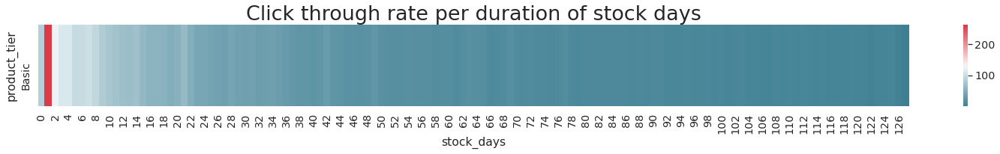

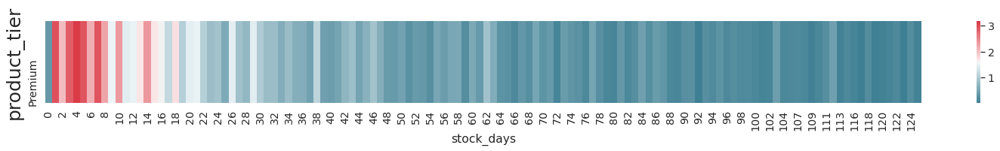

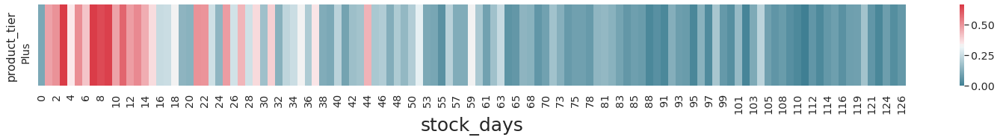

In [47]:
df_heatmap = df_stock_b.pivot_table(values='ctr',index='product_tier',columns='stock_days',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.title('Click through rate per duration of stock days', size = 27)

plt.show()


df_heatmap = df_stock_p.pivot_table(values='ctr',index='product_tier',columns='stock_days',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.ylabel('product_tier',size = 25)

plt.show()


df_heatmap = df_stock_pl.pivot_table(values='ctr',index='product_tier',columns='stock_days',aggfunc=pd.Series.sum)
fig, ax = plt.subplots(figsize=(26,2))         
sns.heatmap(df_heatmap,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='.1f')
plt.xlabel('stock_days',size = 25)


plt.show()